analysis run date: Apr 15 2021

RL108 - t013
- all optical
- post 4ap
- NAPARM export: 2020-12-18_RL108_ps_009

t13 - photostim experiment #2 (NAPARM export: 2020-12-18_RL108_ps_008); 	
11 cells x 3 groups; 5mW per cell


preset: 2020-11-25_PS_250ms-stim-50hz (approach #1)

change every: 250ms

shots per pattern: 10

inter-shot interval (ms): 25

spiral duration (ms): 20

delay first spiral (ms): 5

trial length (s): 5

number of trials: 100

paq: 2020-12-18_RL108_013.paq

## RL108 - t013 - alloptical photostim processing

In [1]:
import sys; sys.path.append('/home/pshah/Documents/code/PackerLab_pycharm/')
import os
import pickle
import alloptical_utils_pj as aoutils
import alloptical_plotting as aoplot
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import utils.funcs_pj as pj

###### IMPORT pkl file containing expobj
trial = 't-013'
date = '2020-12-18'
pkl_path = "/home/pshah/mnt/qnap/Analysis/%s/%s_%s/%s_%s.pkl" % (date, date, trial, date, trial)

expobj, experiment = aoutils.import_expobj(trial=trial, date=date, pkl_path=pkl_path)

cont_inue = True  # i know this is a rather very precarious thing here...


if not hasattr(expobj, 's2p_path'):
    expobj.s2p_path = '/home/pshah/mnt/qnap/Analysis/2020-12-18/suite2p/alloptical-2p-1x-alltrials/plane0'

print('\nExperiment information:\n', expobj.metainfo)


importing expobj for "2020-12-18, t-013" from: /home/pshah/mnt/qnap/Analysis/2020-12-18/2020-12-18_t-013/2020-12-18_t-013.pkl


DONE IMPORT of RL108: t-013, post 4ap 2p all optical, 5 seizures total, trial starts mid first seizure; 11 cells x 3 groups; 5mW per cell preset: 2020-11-25_PS_250ms-stim-50hz (approach #1)

Experiment information:
 {'animal prep.': 'RL108', 'trial': 't-013', 'date': '2020-12-18', 'exptype': 'post 4ap 2p all optical', 'data_path_base': '/home/pshah/mnt/qnap/Data/2020-12-18', 'comments': '5 seizures total, trial starts mid first seizure; 11 cells x 3 groups; 5mW per cell preset: 2020-11-25_PS_250ms-stim-50hz (approach #1)'}


skipped re-collecting subset frames of current trial
skipped re-processing suite2p data for current trial

searching for targeted cells...
(350, 331)
(336, 322)
(177, 324)
(130, 285)
(329, 94)
(262, 292)
(312, 286)
(130, 358)
(272, 351)
(319, 202)
(355, 178)
(165, 139)
(354, 316)
(306, 85)
(166, 87)
(338, 384)
(271, 267)
(299, 273)
(134, 259)
(165, 191)
(312, 47)
(100, 117)
(432, 240)
------- Search completed.
Number of targeted cells:  23

Target cells found in suite2p:  [1, 2, 5, 7, 17, 27, 31, 47, 51, 54, 60, 137, 140, 143, 170, 176, 187, 274, 328, 461, 641, 1948, 2272]  -- 23 cells (out of 34 target coords)


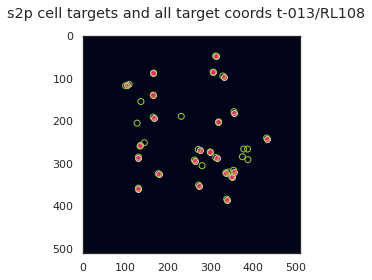



pkl saved to /home/pshah/mnt/qnap/Analysis/2020-12-18/2020-12-18_t-013/2020-12-18_t-013.pkl

skipped re-making TIFF stack of finding s2p targets from suite2p cell list
skipped re-collecting of raw traces from SLM targets


In [2]:
# %% prep for importing data from suite2p for this whole experiment
# determine which frames to retrieve from the overall total s2p output
if not hasattr(expobj, 'suite2p_trials'):
    to_suite2p = ['t-005', 't-006', 't-008', 't-009', 't-010', 't-011', 't-012', 't-013']  # specify all trials that were used in the suite2p runtotal_frames_stitched = 0
    baseline_trials = ['t-005', 't-006', 't-008']  # specify which trials to use as spont baseline
    # note ^^^ this only works currently when the spont baseline trials all come first, and also back to back

    expobj.suite2p_trials = to_suite2p
    expobj.baseline_trials = baseline_trials
    expobj.save()


# main function that imports suite2p data and adds attributes to the expobj
expobj.subset_frames_current_trial(trial=trial, to_suite2p=expobj.suite2p_trials, baseline_trials=expobj.baseline_trials)
expobj.s2pProcessing(s2p_path=expobj.s2p_path, subset_frames=expobj.curr_trial_frames, subtract_neuropil=True)

expobj.target_coords_all = expobj.target_coords
expobj.s2p_targets(force_redo=True)

aoutils.s2pMaskStack(obj=expobj, pkl_list=[pkl_path], s2p_path=expobj.s2p_path,
                     parent_folder=expobj.analysis_save_path)

expobj.raw_traces_from_targets()


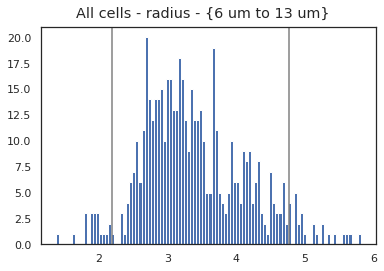

In [3]:
# %% plotting the distribution of radius and aspect ratios - should this be running before the filtering step which is right below????????

radius_list = aoplot.plot_cell_radius_aspectr(expobj, expobj.stat, to_plot='radius', min_vline = 6, max_vline=13)

In [5]:
# %% FILTER ALL CELLS THAT ARE ACTIVE AT LEAST ONCE FOR >2.5*std

# pull out needed variables because numba doesn't work with custom classes (such as this all-optical class object)
cell_ids = expobj.cell_id
raws = expobj.raw
# expobj.append_seizure_frames(bad_frames=None)
photostim_frames = expobj.photostim_frames
radiuses = expobj.radius


# initial quick run to allow numba to compile the function - not sure if this is actually creating time savings
expobj.good_cells = aoutils._good_cells(cell_ids=cell_ids, raws=raws, photostim_frames=expobj.photostim_frames,
                                        std_thresh=2.5)

expobj.save()

# of good cells found:  522  (out of  526  ROIs)


pkl saved to /home/pshah/mnt/qnap/Analysis/2020-12-18/2020-12-18_t-013/2020-12-18_t-013.pkl



In [5]:
# sort the stds dictionary in order of std
stds_sorted = {}
sorted_keys = sorted(stds, key=stds.get)  # [1, 3, 2]

for w in sorted_keys:
    stds_sorted[w] = stds[w]

#%% make a plot for the cells with high std. to make sure that they are not being unfairly excluded out
for cell in list(stds_sorted.keys())[-5:]:
    aoplot.plot_flu_trace(expobj,to_plot='dff',  cell=cell, show=False)
    plt.scatter(x=events_loc_cells[cell], y=flu_events_cells[cell], s=0.5, c='darkgreen')
    plt.show()


NameError: name 'stds' is not defined

In [6]:
print("\n COMPLETED RUNNING ALL OPTICAL PROCESSING PHOTOSTIM.")


 COMPLETED RUNNING ALL OPTICAL PROCESSING PHOTOSTIM.


### processing steps for SEIZURE TRIALS only!!

In [6]:
# downsampled movies of the seizures






MOVING ONTO POST-4AP SZ PROCESSING
First loading up and plotting baseline (comparison) tiff from:  /home/pshah/mnt/qnap/Data/2020-12-18/2020-12-18_t-005/2020-12-18_t-005_Cycle00001_Ch3.tif


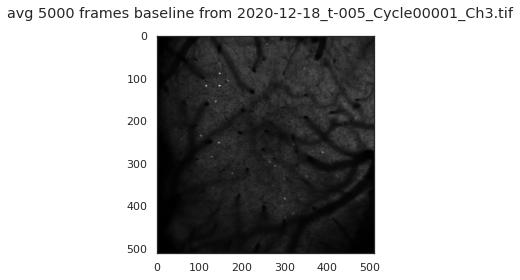

loading up post4ap tiff from:  /home/pshah/mnt/qnap/Data/2020-12-18/2020-12-18_t-013/2020-12-18_t-013_Cycle00001_Ch3.tif
Processing seizures from experiment tiff (wait for all seizure comparisons to be processed), 
 total tiff shape:  (16284, 512, 512)


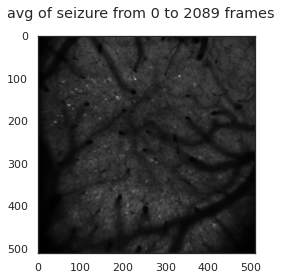

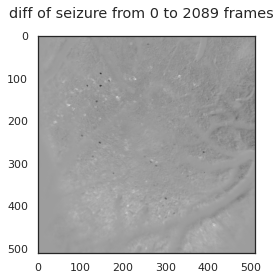

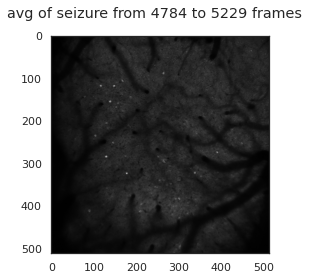

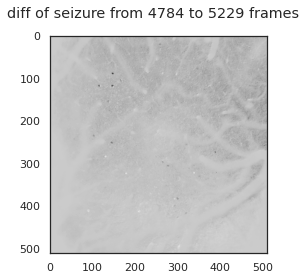

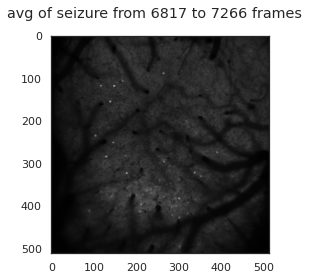

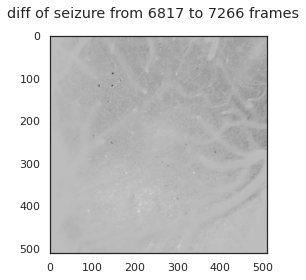

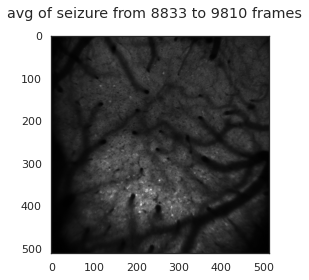

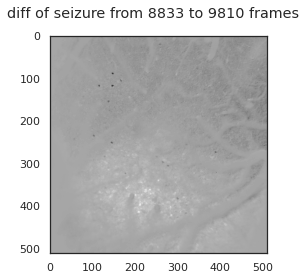

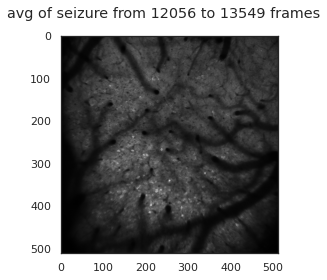

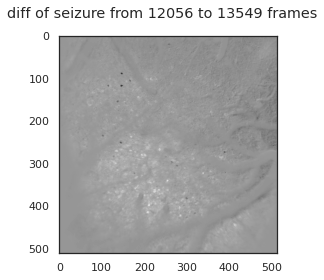

pkl saved to /home/pshah/mnt/qnap/Analysis/2020-12-18/2020-12-18_t-013/2020-12-18_t-013.pkl
pkl saved to /home/pshah/mnt/qnap/Analysis/2020-12-18/2020-12-18_t-013/2020-12-18_t-013.pkl
Extracting the top 1 eigendimensions from image


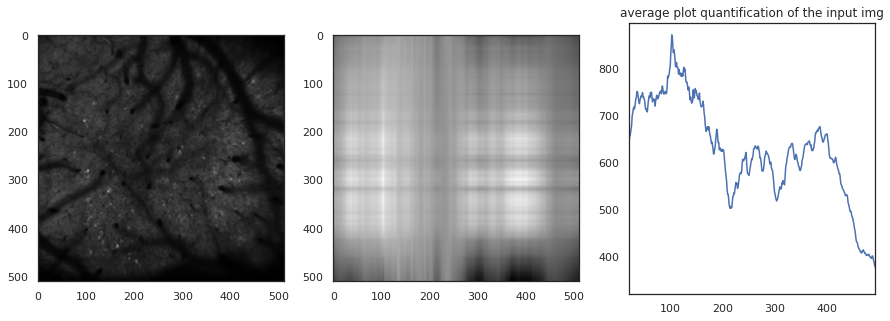

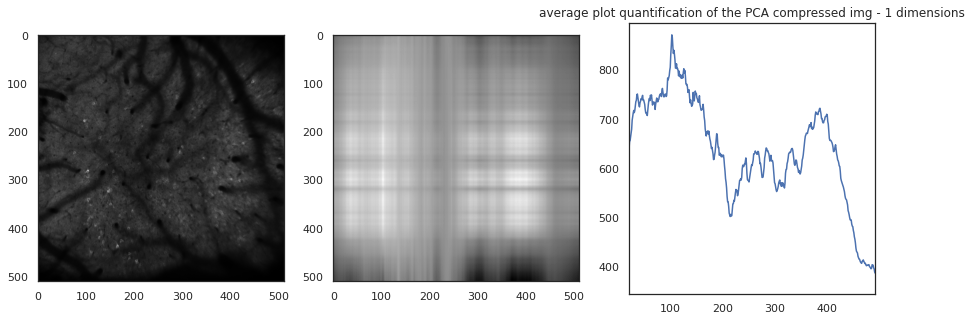

Extracting the top 1 eigendimensions from image


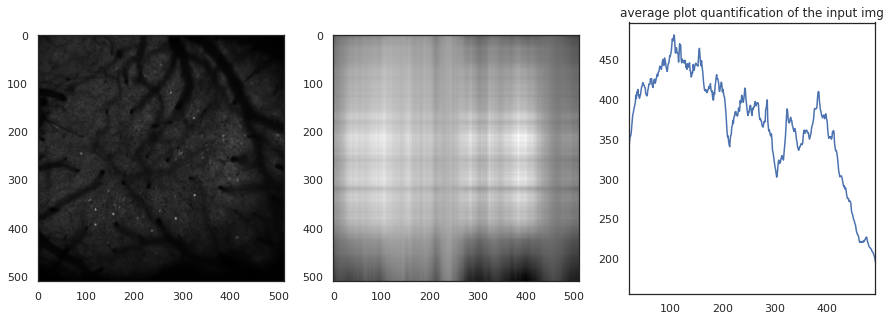

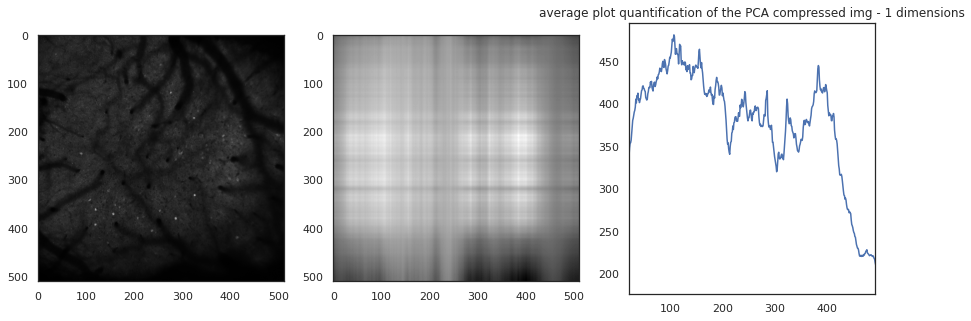

Extracting the top 1 eigendimensions from image


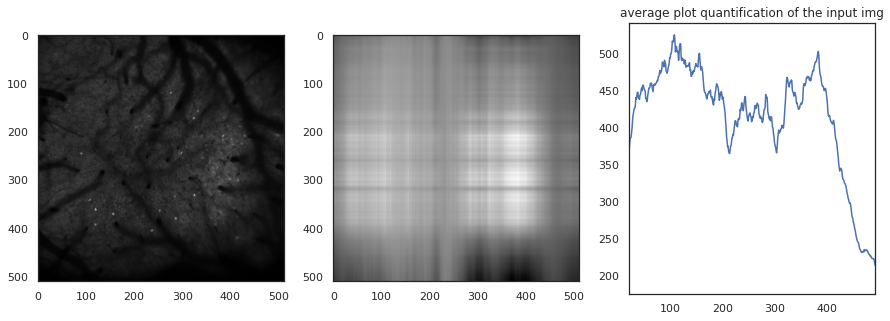

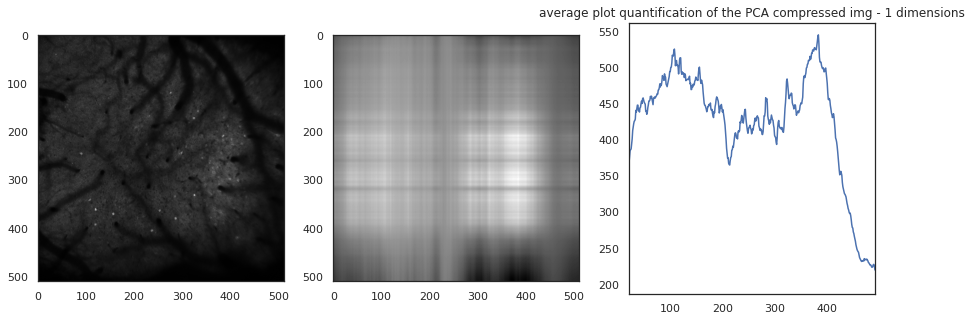

Extracting the top 1 eigendimensions from image


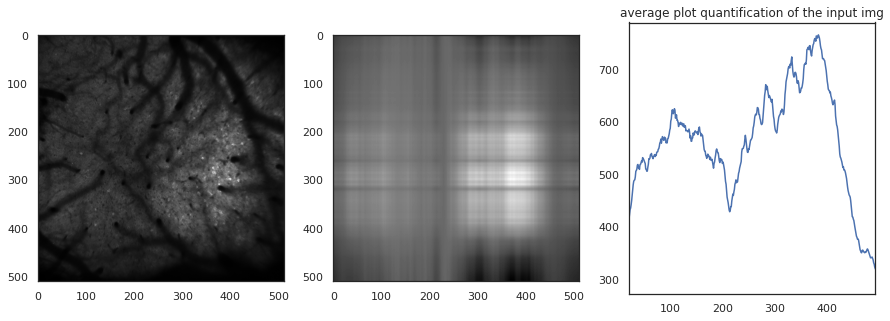

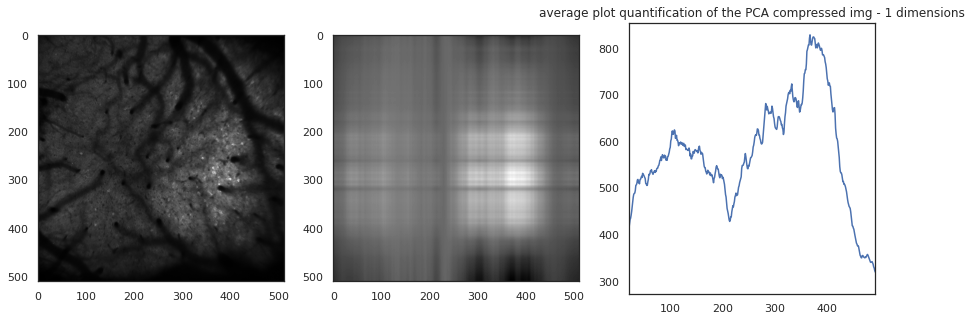

Extracting the top 1 eigendimensions from image


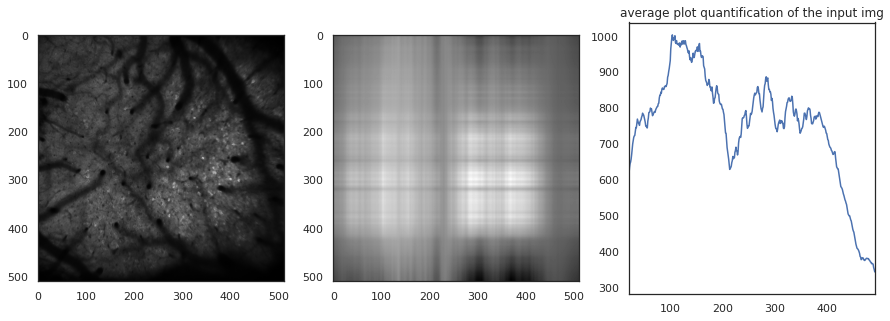

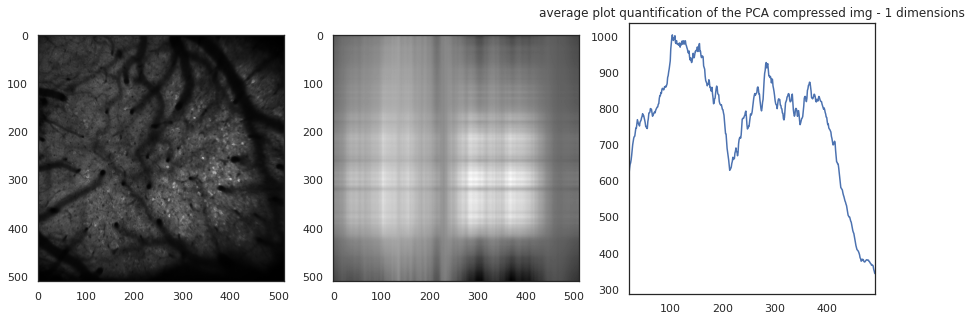

In [5]:
if 'post' in expobj.metainfo['exptype'] and '4ap' in expobj.metainfo['exptype']:
    print('\nMOVING ONTO POST-4AP SZ PROCESSING')
else:
    sys.exit()


expobj.avg_sub_l, im_sub_l, im_diff_l = expobj.MeanSeizureImages(
    baseline_tiff="/home/pshah/mnt/qnap/Data/2020-12-18/2020-12-18_t-005/2020-12-18_t-005_Cycle00001_Ch3.tif",
    frames_last=1000)

# counter = 0
# for i in avg_sub_l:
#     plt.imshow(i); plt.suptitle('%s' % counter); plt.show()
#     counter += 1

expobj.avg_stim_images(stim_timings=expobj.stim_start_frames, peri_frames=50, to_plot=False, save_img=True)
expobj.save_pkl()

for i in range(len(expobj.avg_sub_l)):
    img = pj.rotate_img_avg(expobj.avg_sub_l[i], angle=90)
    # PCA decomposition of the avg_seizure images
    img_compressed = pj.pca_decomp_image(img, components=1, plot_quant=True)


In [39]:
print(expobj.stims_bf_sz)
on_ = [expobj.stim_start_frames[0]]  # uncomment if imaging is starting mid seizure
print(on_ + expobj.stims_bf_sz)

[4775, 6702, 8777, 12038]
[328, 4775, 6702, 8777, 12038]


In [40]:
on_ = []
on_ = [expobj.stim_start_frames[0]]  # uncomment if imaging is starting mid seizure
expobj.stims_bf_sz = on_ + expobj.stims_bf_sz




[328, 4775, 6702, 8777, 12038]



|- stims_in_sz: [328, 476, 624, 772, 921, 1069, 1217, 1365, 1514, 1662, 1810, 1958, 4923, 5071, 5219, 6850, 6998, 7146, 8925, 9074, 9222, 9370, 9518, 9666, 12186, 12335, 12483, 12631, 12779, 12928, 13076, 13224, 13372, 13521] 
|- stims_out_sz: [2107, 2255, 2403, 2551, 2699, 2848, 2996, 3144, 3292, 3441, 3589, 3737, 3885, 4034, 4182, 4330, 4478, 4627, 4775, 5368, 5516, 5664, 5812, 5961, 6109, 6257, 6405, 6554, 6702, 7295, 7443, 7591, 7739, 7888, 8036, 8184, 8332, 8481, 8629, 8777, 9815, 9963, 10111, 10259, 10408, 10556, 10704, 10852, 11001, 11149, 11297, 11445, 11594, 11742, 11890, 12038, 13669, 13817, 13965, 14113, 14262, 14410, 14558, 14706, 14855] 
|- stims_bf_sz: [328, 4775, 6702, 8777, 12038] 
|- stims_af_sz: [2107, 5368, 7295, 9815, 13669]


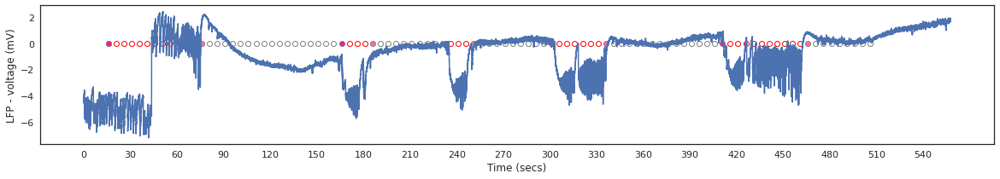

pkl saved to /home/pshah/mnt/qnap/Analysis/2020-12-18/2020-12-18_t-013/2020-12-18_t-013.pkl


In [41]:
# %% classifying stims as in_sz or out_sz or before_sz or after_sz

expobj.stims_in_sz = [stim for stim in expobj.stim_start_frames if stim in expobj.seizure_frames]
expobj.stims_out_sz = [stim for stim in expobj.stim_start_frames if stim not in expobj.seizure_frames]
expobj.stims_bf_sz = [stim for stim in expobj.stim_start_frames
                      for sz_start in expobj.seizure_lfp_onsets
                      if 0 < (sz_start - stim) < 5 * expobj.fps]  # select stims that occur within 5 seconds before of the sz onset
expobj.stims_af_sz = [stim for stim in expobj.stim_start_frames
                      for sz_start in expobj.seizure_lfp_offsets
                      if 0 < -1 * (sz_start - stim) < 5 * expobj.fps]  # select stims that occur within 5 seconds afterof the sz offset

on_ = []
on_ = [expobj.stim_start_frames[0]]  # uncomment if imaging is starting mid seizure
expobj.stims_bf_sz = on_ + expobj.stims_bf_sz

print('\n|- stims_in_sz:', expobj.stims_in_sz, '\n|- stims_out_sz:', expobj.stims_out_sz,
      '\n|- stims_bf_sz:', expobj.stims_bf_sz, '\n|- stims_af_sz:', expobj.stims_af_sz)
aoplot.plot_lfp_stims(expobj)



expobj.save_pkl()


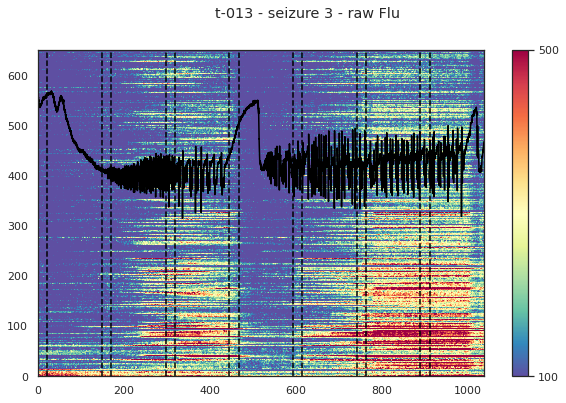

In [46]:
# %% PLOT seizure period as heatmap

sz = 3
sz_onset, sz_offset = expobj.stims_bf_sz[sz], expobj.stims_af_sz[sz]
x = expobj.raw[[expobj.cell_id.index(cell) for cell in expobj.good_cells], sz_onset:sz_offset]

stims = [(stim - sz_onset) for stim in expobj.stim_start_frames if sz_onset <= stim < sz_offset]
stims_off = [(stim + expobj.duration_frames - 1) for stim in stims]

x_bf = expobj.stim_times[np.where(expobj.stim_start_frames == expobj.stims_bf_sz[sz])[0][0]]
x_af = expobj.stim_times[np.where(expobj.stim_start_frames == expobj.stims_af_sz[sz])[0][0]]

lfp_signal = expobj.lfp_signal[x_bf:x_af]

aoplot.plot_traces_heatmap(x, stim_on=stims, stim_off=stims_off, cmap='Spectral_r', figsize=(10,6),
                           title=('%s - seizure %s - raw Flu' % (trial, sz)), xlims=None, vmin=100, vmax=500,
                           lfp_signal=lfp_signal)

In [44]:
# %% MAKE SUBSELECTED TIFFS OF INVIDUAL SEIZURES BASED ON THEIR START AND STOP FRAMES

expobj._subselect_sz_tiffs(onsets=expobj.stims_bf_sz, offsets=expobj.stims_af_sz)



-----Making raw sz movies by cropping original raw tiff
reading in seizure trial from:  /home/pshah/mnt/qnap/Data/2020-12-18/2020-12-18_t-013/2020-12-18_t-013_Cycle00001_Ch3.tif 

cropping sz frames (328, 2107)
cropping sz frames (4775, 5368)
cropping sz frames (6702, 7295)
cropping sz frames (8777, 9815)
cropping sz frames (12038, 13669)

done. saved to: /home/pshah/mnt/qnap/Analysis/2020-12-18/2020-12-18_t-013/


working on classifying cells for stims start frames:
|- [328, 476, 624, 772, 921, 1069, 1217, 1365, 1514, 1662, 1810, 1958, 2107]


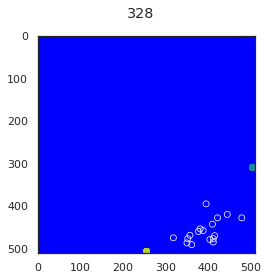

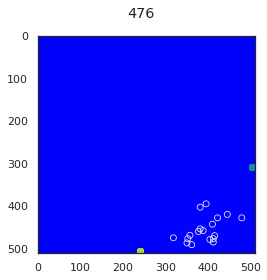

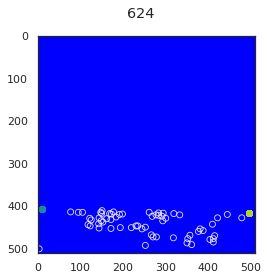

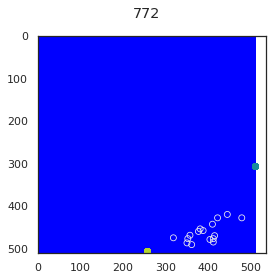

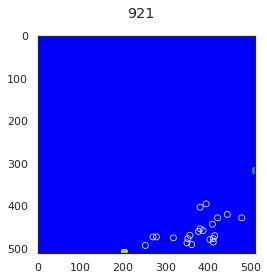

...

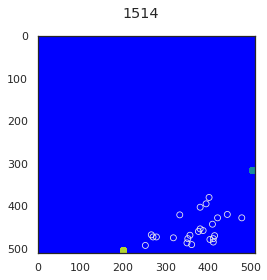

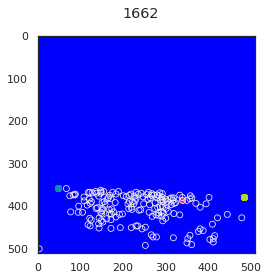

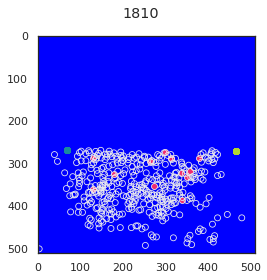

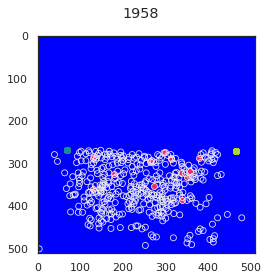

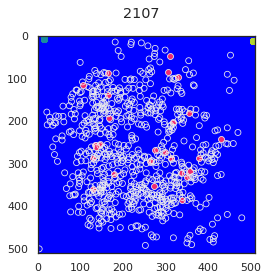

|- [4775, 4923, 5071, 5219, 5368]


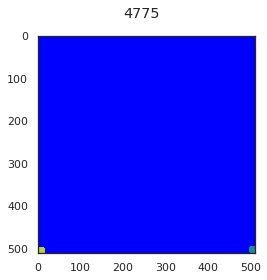

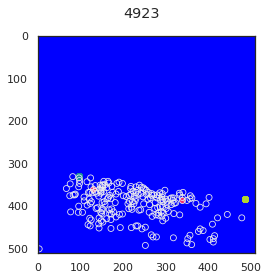

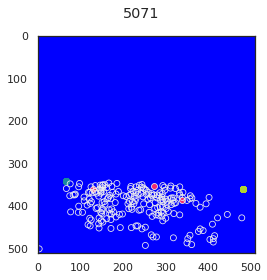

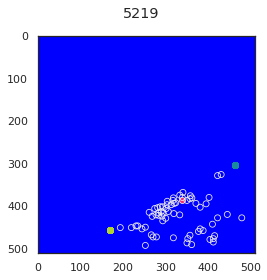

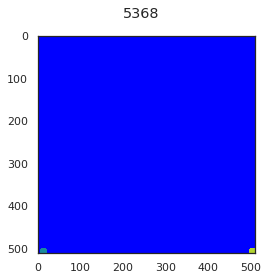

|- [6702, 6850, 6998, 7146, 7295]


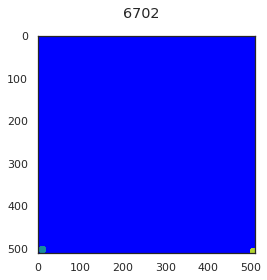

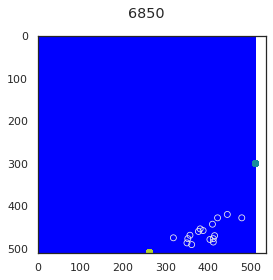

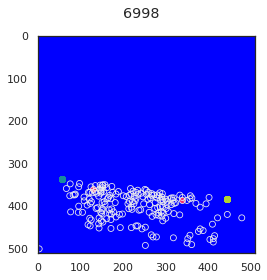

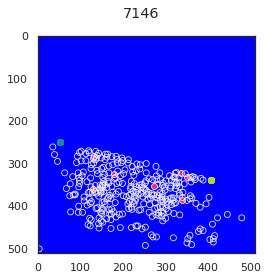

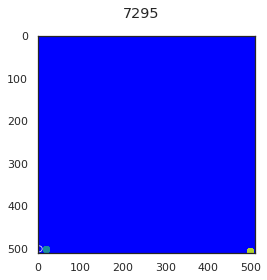

|- [8777, 8925, 9074, 9222, 9370, 9518, 9666, 9815]


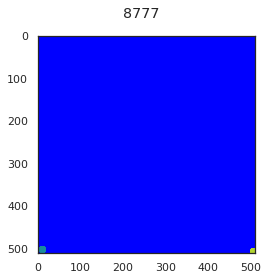

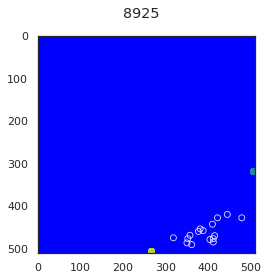

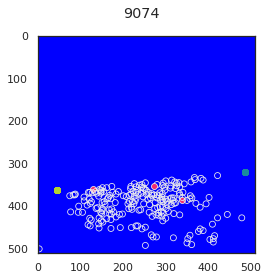

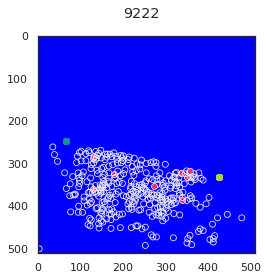

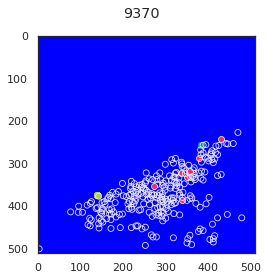

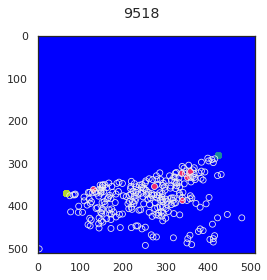

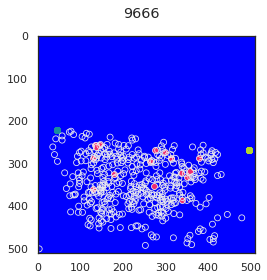

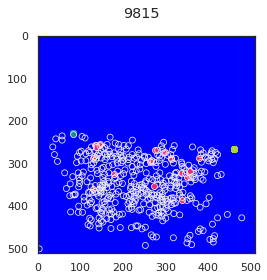

|- [12038, 12186, 12335, 12483, 12631, 12779, 12928, 13076, 13224, 13372, 13521, 13669]


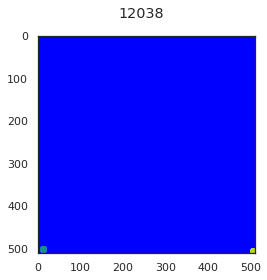

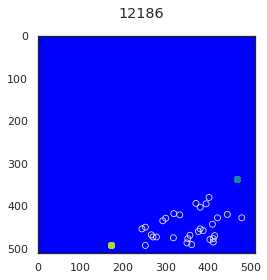

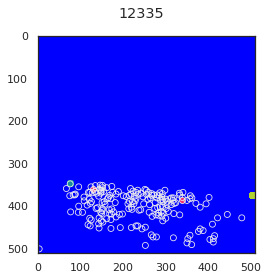

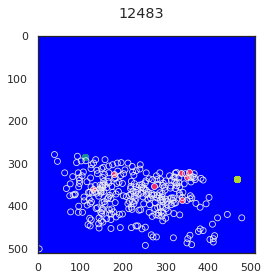

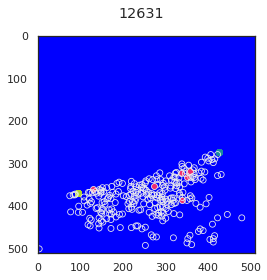

...

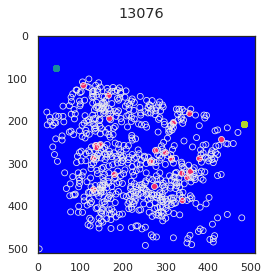

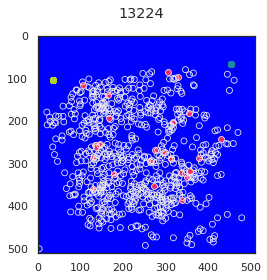

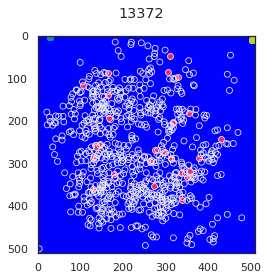

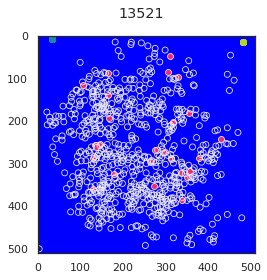

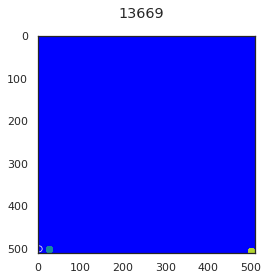

In [24]:
# %% classifying cells as in or out of the current seizure location in the FOV

# FRIST manually draw boundary on the image in ImageJ and save results as CSV to analysis folder under boundary_csv
if cont_inue:
    pass
else:
    sys.exit()


on_ = []
on_ = [expobj.stim_start_frames[0]]  # uncomment if imaging is starting mid seizure
on_.extend(expobj.stims_bf_sz)

# need to run this twice to correct for mis-assignment of cells (look at results and then find out which stims need to be flipped)
expobj.not_flip_stims = [2107, 7146, 9222, 9666, 9815, 12779, 12928, 13076, 13224, 13372, 
                        13521, ]  # specify here the stims where the flip=False leads to incorrect assignment
cont_inue2 = True


print('working on classifying cells for stims start frames:')
expobj.cells_sz_stim = {}
for on, off in zip(on_, expobj.stims_af_sz):
    stims_of_interest = [stim for stim in expobj.stim_start_frames if on <= stim <= off]
    print('|-', stims_of_interest)

    for stim in stims_of_interest:
        # import the CSV file in and classify cells by their location in or out of seizure
        sz_border_path = "%s/boundary_csv/2020-12-18_%s_stim-%s.tif_border.csv" % (expobj.analysis_save_path[:-1], trial, stim)
        if stim in expobj.not_flip_stims:
            flip = False
        else:
            flip = True

        in_sz = expobj.classify_cells_sz(sz_border_path, to_plot=True, title='%s' % stim, flip=flip)
        expobj.cells_sz_stim[stim] = in_sz  # for each stim, there will be a list of cells that will be classified as in seizure or out of seizure
# expobj.save()

if cont_inue2:
    pass
else:
    sys.exit()

### processing steps for ALL OPTICAL PHOTOSTIM related stuff

In [2]:
# Collect pre to post stim traces for PHOTOSTIM TARGETED CELLS, FILTER FOR GOOD PHOTOSTIM. TARGETED CELLS with responses above threshold = 1 std of the prestim std

expobj.pre_stim = 1*int(expobj.fps)  # specify pre-stim and post-stim periods of analysis and plotting
expobj.post_stim = 3*int(expobj.fps)

# function for gathering all good photostim cells who respond on average across all trials to the photostim
# note that the threshold for this is 1 * std of the prestim raw flu (fluorescence trace)
expobj.targets_dff, expobj.targets_dff_avg, expobj.targets_dfstdF, \
expobj.targets_dfstdF_avg, expobj.targets_stims_raw, expobj.targets_stims_raw_avg = \
    aoutils.get_s2ptargets_stim_traces(expobj=expobj, normalize_to='pre-stim', pre_stim=expobj.pre_stim,
                                       post_stim=expobj.post_stim)

aoutils._good_photostim_cells(expobj=expobj, pre_stim=expobj.pre_stim, post_stim=expobj.post_stim, dff_threshold=None)

# what does threshold value mean? add more descriptive print output for that

# Collect pre to post stim traces for NON-TARGETS

expobj.dff_traces, expobj.dff_traces_avg, expobj.dfstdF_traces, \
    expobj.dfstdF_traces_avg, expobj.raw_traces, expobj.raw_traces_avg = \
    aoutils.get_nontargets_stim_traces_norm(expobj=expobj, normalize_to='pre-stim', pre_stim=expobj.pre_stim,
                                            post_stim=expobj.post_stim)


Cell #1 - dFF post-stim: 16.54997 (threshold value = 3.5172510464986146)
Cell #2 - dFF post-stim: 9.181587 (threshold value = 3.431872145334893)
Cell #5 - dFF post-stim: 29.737562 (threshold value = 3.931038538614871)
Cell #27 - dFF post-stim: 13.503341 (threshold value = 2.88310248851775)
Cell #31 - dFF post-stim: 8.775621 (threshold value = 6.501940663655603)
Cell #47 - dFF post-stim: 23.729086 (threshold value = 6.9276659289995735)
Cell #51 - dFF post-stim: 24.0657 (threshold value = 10.619155756632495)
Cell #54 - dFF post-stim: 18.793299 (threshold value = 3.0735477368036754)
Cell #60 - dFF post-stim: 8.614623 (threshold value = 5.863047113021224)
Cell #137 - dFF post-stim: 11.77441 (threshold value = 4.397528139750136)
Cell #143 - dFF post-stim: 9.375382 (threshold value = 6.097936280568433)
Cell #170 - dFF post-stim: 19.278534 (threshold value = 4.150946633021022)
Cell #176 - dFF post-stim: 9.62668 (threshold value = 3.111376063028956)
Cell #187 - dFF post-stim: 14.641014 (thresh

In [3]:
#%% turn important cell x time arrays into pandas dataframes

# raw Flu traces of all good cells
columns = [f'{num}' for num in range(expobj.curr_trial_frames[0], expobj.curr_trial_frames[1])]
index = [f'{num}' for num in expobj.good_cells]
idxs = [expobj.cell_id.index(cell) for cell in expobj.good_cells]
expobj.raw_df = pd.DataFrame(expobj.raw[idxs, :], columns=columns, index=index)


# raw baseline Flu traces of all good cells
# columns = [f'{num}' for num in range(baseline_frames[0], baseline_frames[1])]
# index = [f'{num}' for num in expobj.good_cells]
# idxs = [expobj.cell_id.index(cell) for cell in expobj.good_cells]
# expobj.baseline_raw_df = pd.DataFrame(expobj.baseline_raw[idxs, :], columns=columns, index=index)



In [4]:
# %% calculate dFF responses of all cells to photostimulation trials expobj

# non-targeted cells: calculate response of non-targeted cells in response to photostim. trials
# - make a pandas dataframe that contains the post-stim response of all cells at each stim timepoint
#   give group name 'non_targets' to the non-targetted cells, and the appropriate SLM group number to targetted cells


expobj.dff_responses_all_cells = aoutils.all_cell_responses_dff(expobj, normalize_to='pre-stim')

# calculate the avg response values for all cells across all stims
average_responses = np.mean(expobj.dff_responses_all_cells[expobj.dff_responses_all_cells.columns[1:]], axis=1)
responses = {'cell_id': [], 'group': [], 'Avg. dFF response': []}
for cell in expobj.good_cells:
    if cell in expobj.s2p_cell_targets:
        responses['cell_id'].append(cell)
        responses['group'].append('photostim target')
        responses['Avg. dFF response'].append(average_responses[cell])
    else:
        responses['cell_id'].append(cell)
        responses['group'].append('non-target')
        responses['Avg. dFF response'].append(average_responses[cell])

expobj.average_responses_df = pd.DataFrame(responses)

print('\nThe avg. dF/F responses of photostim targets is: %s' % np.mean(
    expobj.average_responses_df[expobj.average_responses_df.group == 'photostim target'])[1])


Completed gathering dFF responses to photostim for 522 cells
risky cells (with low Flu values to normalize with):  [73, 83, 173, 248, 291, 333, 334, 359, 373, 388, 443, 444, 481, 523, 559, 560, 589, 624, 670, 751, 757, 778, 809, 820, 821, 830, 881, 896, 904, 912, 917, 1004, 1010, 1022, 1066, 1143, 1243, 1267, 1272, 1274, 1285, 1291, 1318, 1352, 1359, 1387, 1413, 1445, 1464, 1544, 1560, 1568, 1596, 1612, 1632, 1644, 1659, 1672, 1678, 1710, 1722, 1755, 1767, 1777, 1794, 1802, 1803, 1805, 1818, 1832, 1836, 1858, 1880, 1882, 1885, 1919, 1925, 1933, 1951, 1955, 1983, 1988, 1989, 2003, 2011, 2061, 2068, 2071, 2078, 2087, 2100, 2111, 2128, 2160, 2194, 2196, 2197, 2203, 2218, 2227, 2253, 2274, 2288]

The avg. dF/F responses of photostim targets is: 12.302406307684521


In [5]:
# %% calculate dF_stdF responses of all cells to photostimulation trials expobj

expobj.dfstdf_all_cells = aoutils.all_cell_responses_dFstdF(expobj)

# calculate the avg response values for all cells across all stims
average_responses_dfstdf = np.mean(expobj.dfstdf_all_cells[expobj.dfstdf_all_cells.columns[1:]], axis=1)
responses = {'cell_id': [], 'group': [], 'Avg. dF/stdF response': []}
for cell in expobj.good_cells:
    if cell in expobj.s2p_cell_targets:
        responses['cell_id'].append(cell)
        responses['group'].append('photostim target')
        responses['Avg. dF/stdF response'].append(average_responses_dfstdf[cell])
    else:
        responses['cell_id'].append(cell)
        responses['group'].append('non-target')
        responses['Avg. dF/stdF response'].append(average_responses_dfstdf[cell])

expobj.average_responses_dfstdf = pd.DataFrame(responses)

print('\nThe avg. dF/stdF responses of photostim targets is: %s' % np.mean(
    expobj.average_responses_dfstdf[expobj.average_responses_dfstdf.group == 'photostim target'])[1])

expobj.save()

Completed gathering dF/stdF responses to photostim for 522 cells

The avg. dF/stdF responses of photostim targets is: 0.2956258161684689


pkl saved to /home/pshah/mnt/qnap/Analysis/2020-12-18/2020-12-18_t-013/2020-12-18_t-013.pkl



In [15]:
sys.exit()

SystemExit: 

/home/pshah/anaconda3/envs/2021/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3445: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


## alloptical photostim analysis - t-013

trials: ['t-013'] -- post 4ap all optical -- seizures, discard all frames = true

NAPARM export: 2020-12-18_RL108_ps_008


importing expobj for "2020-12-18, t-013" from: /home/pshah/mnt/qnap/Analysis/2020-12-18/2020-12-18_t-013/2020-12-18_t-013.pkl


DONE IMPORT of RL108: t-013, post 4ap 2p all optical, 5 seizures total, trial starts mid first seizure; 11 cells x 3 groups; 5mW per cell preset: 2020-11-25_PS_250ms-stim-50hz (approach #1)


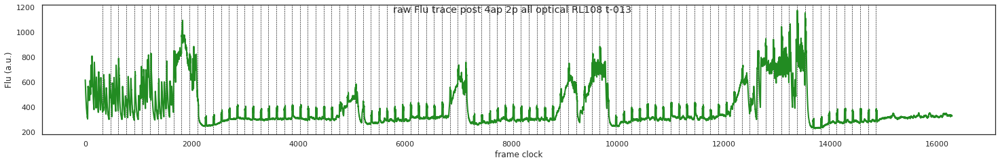

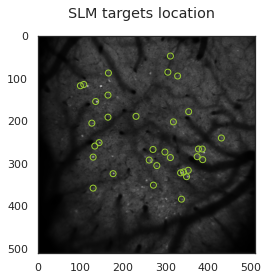

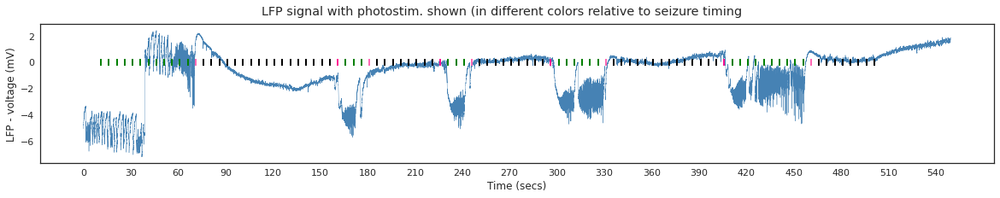

In [1]:
# %% IMPORT MODULES AND TRIAL expobj OBJECT
import sys

sys.path.append('/home/pshah/Documents/code/PackerLab_pycharm/')
sys.path.append('/home/pshah/Documents/code/')
import alloptical_utils_pj as aoutils
import alloptical_plotting as aoplot
import utils.funcs_pj as pj

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from skimage import draw

###### IMPORT pkl file containing data in form of expobj
trial = 't-013'
date = '2020-12-18'
pkl_path = "/home/pshah/mnt/qnap/Analysis/%s/%s_%s/%s_%s.pkl" % (date, date, trial, date, trial)
# pkl_path = "/home/pshah/mnt/qnap/Data/%s/%s_%s/%s_%s.pkl" % (date, date, trial, date, trial)

expobj, experiment = aoutils.import_expobj(trial=trial, date=date, pkl_path=pkl_path)

if not hasattr(expobj, 's2p_path'):
    expobj.s2p_path = '/home/pshah/mnt/qnap/Analysis/2020-12-18/suite2p/alloptical-2p-1x-alltrials/plane0'

if not hasattr(expobj, 'meanRawFluTrace'):
    expobj.mean_raw_flu_trace(plot=True)

plot = True
if plot:
    aoplot.plotMeanRawFluTrace(expobj=expobj, stim_span_color=None, x_axis='frames', figsize=[20, 3])
    # aoplot.plotLfpSignal(expobj, stim_span_color=None, x_axis='frames', figsize=[20, 3])
    aoplot.plotSLMtargetsLocs(expobj, background=expobj.meanFluImg_registered)
    aoplot.plot_lfp_stims(expobj)


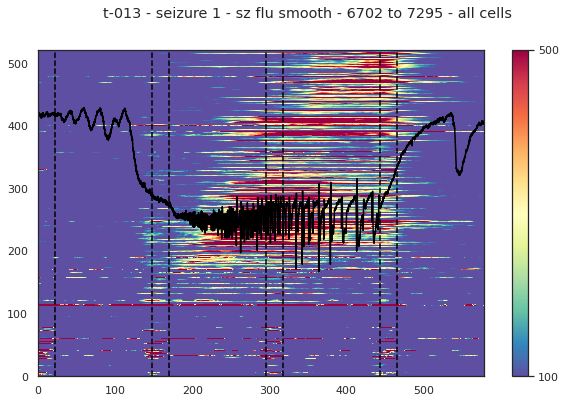

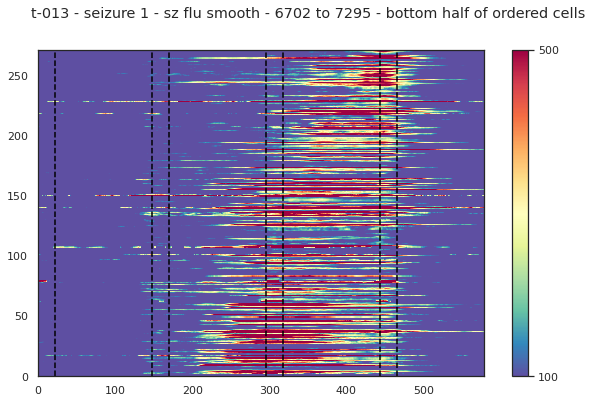

In [7]:
# %% PLOT seizure period as heatmap

sz = 1
sz_onset, sz_offset = expobj.stims_bf_sz[sz], expobj.stims_af_sz[sz+1]

# -- approach of dFF normalize to the mean of the Flu data 2 seconds before the seizure
pre_sz = 2*int(expobj.fps)
sz_flu = expobj.raw[[expobj.cell_id.index(cell) for cell in expobj.good_cells], sz_onset - pre_sz: sz_offset]
sz_flu_smooth = np.array([pj.smooth_signal(signal, w=15) for signal in sz_flu])  # grouped average of the raw signal
x_norm = np.array([pj.dff(flu[pre_sz:], np.mean(flu[:pre_sz])) * 100 for flu in sz_flu_smooth])


stims = [(stim - sz_onset) for stim in expobj.stim_start_frames if sz_onset <= stim < sz_offset]
stims_off = [(stim + expobj.stim_duration_frames - 1) for stim in stims]

x_bf = expobj.stim_times[np.where(expobj.stim_start_frames == expobj.stims_bf_sz[sz])[0][0]]
x_af = expobj.stim_times[np.where(expobj.stim_start_frames == expobj.stims_af_sz[sz+1])[0][0]]

lfp_signal = expobj.lfp_signal[x_bf:x_af]

# -- ordering cells based on their order of reaching top 5% signal threshold
x_95 = [np.percentile(trace, 95) for trace in x_norm]

x_peak = [np.min(np.where(x_norm[i] > x_95[i])) for i in range(len(x_norm))]
new_order = np.argsort(x_peak)
x_ordered = x_norm[new_order]

# plot heatmap of dFF processed Flu signals for all cells for selected sz and ordered as determined above
aoplot.plot_traces_heatmap(x_ordered, stim_on=stims, stim_off=stims_off, cmap='Spectral_r', figsize=(10, 6),
                           title=('%s - seizure %s - sz flu smooth - %s to %s - all cells' % (trial, sz, sz_onset, sz_offset)),
                           xlims=None, vmin=100, vmax=500, lfp_signal=lfp_signal)

# just the bottom half cells that seems to show more of an order
x_ordered = x_norm[new_order[250:]]
aoplot.plot_traces_heatmap(x_ordered, stim_on=stims, stim_off=stims_off, cmap='Spectral_r', figsize=(10, 6),
                           title=('%s - seizure %s - sz flu smooth - %s to %s - bottom half of ordered cells' % (trial, sz, sz_onset, sz_offset)),
                           xlims=None, vmin=100, vmax=500)


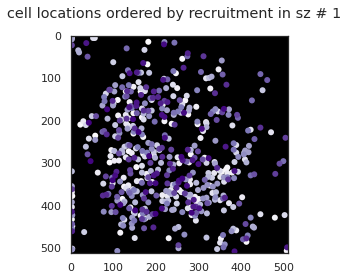

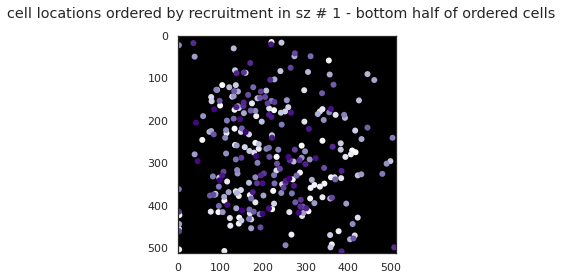

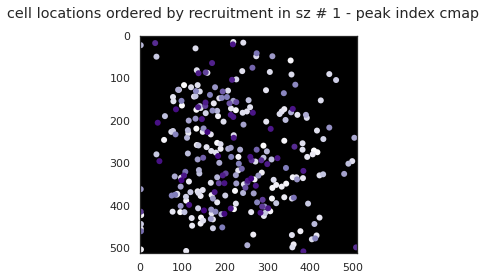

In [8]:
# %% PLOT cell location with cmap based on their order of reaching top 5% signal during sz event

cell_ids_ordered = list(np.array(expobj.cell_id)[new_order])
aoplot.plot_cell_loc(expobj, cells=cell_ids_ordered, show_s2p_targets=False, color_float_list=list(range(len(cell_ids_ordered))),
                     title='cell locations ordered by recruitment in sz # %s' % sz, invert_y=True, cmap='Purples')

# just the bottom half cells that seems to show more of an order
cell_ids_ordered = list(np.array(expobj.cell_id)[new_order[250:]])
aoplot.plot_cell_loc(expobj, cells=cell_ids_ordered, show_s2p_targets=False, color_float_list=list(range(len(cell_ids_ordered))),
                     title='cell locations ordered by recruitment in sz # %s - bottom half of ordered cells' % sz, invert_y=True, cmap='Purples')

# just the bottom half cells that seems to show more of an order
cell_ids_ordered = list(np.array(expobj.cell_id)[new_order])
aoplot.plot_cell_loc(expobj, cells=cell_ids_ordered[250:], show_s2p_targets=False, color_float_list=list(np.array(x_peak)[new_order][250:]),
                     title='cell locations ordered by recruitment in sz # %s - peak index cmap' % sz, invert_y=True, cmap='Purples')


/home/pshah/Documents/code/PackerLab_pycharm/alloptical_plotting.py:134: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


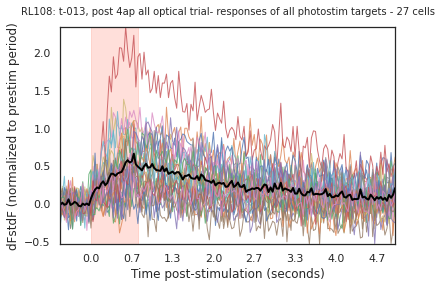

In [3]:
# %% PLOT AVG PHOTOSTIM PRE- POST- TRACE AVGed OVER ALL PHOTOSTIM. TRIALS - PHOTOSTIM TARGETTED cells

# x = np.asarray([i for i in expobj.good_photostim_cells_stim_responses_dFF[0]])
x = np.asarray([i for i in expobj.targets_dfstdF_avg])
# y_label = 'pct. dFF (normalized to prestim period)'
y_label = 'dFstdF (normalized to prestim period)'

aoplot.plot_photostim_avg(dff_array=x, expobj=expobj, stim_duration=expobj.duration_frames, pre_stim=expobj.pre_stim,
                          post_stim=expobj.post_stim,
                          title=(experiment + '- responses of all photostim targets'),
                          y_label=y_label, x_label='Time post-stimulation (seconds)')


/home/pshah/Documents/code/PackerLab_pycharm/alloptical_plotting.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


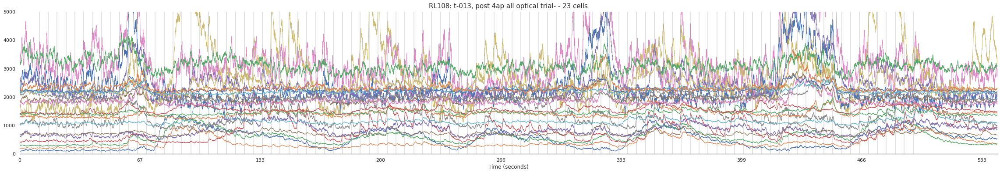

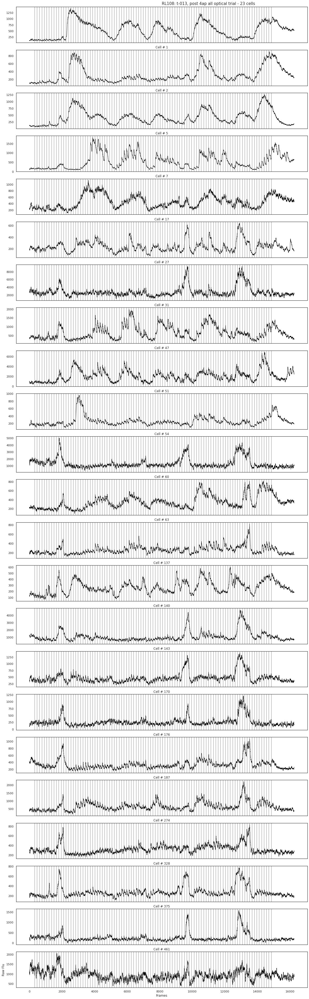

In [4]:
# %% PLOT ENTIRE TRIAL - targeted cells plotted individually as subplots

expobj.raw_targets = [expobj.raw[expobj.cell_id.index(i)] for i in expobj.good_photostim_cells_all]
expobj.dff_targets = aoutils.normalize_dff(np.array(expobj.raw_targets))
expobj.targets_dff_base = aoutils.normalize_dff_baseline(
    arr=expobj.raw_df.loc[[str(x) for x in expobj.s2p_cell_targets]],
    baseline_array=expobj.baseline_raw_df)
# plot_photostim_subplots(dff_array=dff_targets,
#                 title=(experiment + '%s responses of responsive cells' % len(expobj.good_photostim_cells_stim_responses_dFF)))
to_plot = expobj.dff_targets


aoplot.plot_photostim_overlap_plots(dff_array=to_plot, expobj=expobj,
                                    y_lims=[0, 5000], title=(experiment + '-'))

aoplot.plot_photostim_subplots(dff_array=to_plot, expobj=expobj, x_label='Frames',
                               y_label='Raw Flu',
                               title=(experiment))


In [ ]:
# %% plot SLM photostim individual targets -- full traces, dff normalized

expobj.dff_SLMTargets = aoutils.normalize_dff(np.array(expobj.raw_SLMTargets))


# make rolling average for these plots to smooth out the traces a little more
w = 10
to_plot = [(np.convolve(trace, np.ones(w), 'valid') / w) for trace in expobj.dff_SLMTargets[:3]]

aoplot.plot_photostim_traces(array=to_plot, expobj=expobj, x_label='Frames',
                             y_label='dFF Flu', title=experiment)


In [ ]:
# %% collect and plot peri- photostim traces for individual SLM target individual, incl. individual traces 
# for each stim

pre_stim = expobj.pre_stim
post_stim = expobj.post_stim
expobj.SLMTargets_stims_dff, expobj.SLMTargets_stims_dffAvg, expobj.SLMTargets_stims_dfstdF, \
expobj.SLMTargets_stims_dfstdF_avg, expobj.SLMTargets_stims_raw, expobj.SLMTargets_stims_rawAvg = \
    expobj.get_alltargets_stim_traces_norm(pre_stim=pre_stim, post_stim=post_stim)

expobj.save()



# array = (np.convolve(SLMTargets_stims_raw[targets_idx], np.ones(w), 'valid') / w)

# targets_idx = 0
plot = False
for i in range(0, expobj.n_targets_total):
    SLMTargets_stims_raw, SLMTargets_stims_dff, SLMtargets_stims_dfstdF = expobj.get_alltargets_stim_traces_norm(targets_idx=i, pre_stim=pre_stim,
                                                                                               post_stim=post_stim)
    if plot:
        w = 2
        array = [(np.convolve(trace, np.ones(w), 'valid') / w) for trace in SLMTargets_stims_raw]
        random_sub = np.random.randint(0,100,10)
        aoplot.plot_periphotostim_avg(arr=SLMtargets_stims_dfstdF[random_sub], expobj=expobj, stim_duration=expobj.stim_duration_frames,
                                      title='Cell ' + str(i), pre_stim=pre_stim, post_stim=post_stim, color='steelblue', y_lims=[-0.5, 2.5])
    # plt.show()


random_sub = np.random.randint(0,expobj.n_targets_total, 5)
w = 3
arr_to_plot = [(np.convolve(trace, np.ones(w), 'valid') / w) for trace in expobj.raw_SLMTargets[random_sub]]

aoplot.plot_photostim_traces(array=arr_to_plot, expobj=expobj, x_label='Frames',
                             y_label='dFF Flu', title=experiment, scatter=np.array(list(expobj.hits_cells.values()))[random_sub],
                             line_ids=random_sub)



In [ ]:
# %% photostim. SUCCESS RATE MEASUREMENTS and PLOT - PHOTOSTIM TARGETED CELLS
# measure, for each cell, the pct of trials in which the dFF > 20% post stim (normalized to pre-stim avgF for the trial and cell)
# can plot this as a bar plot for now showing the distribution of the reliability measurement

SLMtarget_ids = list(range(len(expobj.SLMTargets_stims_dfstdF)))

expobj.StimSuccessRate_SLMtargets, expobj.hits_SLMtargets, expobj.responses_SLMtargets = \
    aoutils.calculate_StimSuccessRate(expobj, cell_ids=SLMtarget_ids, raw_traces_stims=expobj.SLMTargets_stims_raw,
                                      dfstdf_threshold=0.3, pre_stim=expobj.pre_stim, sz_filter=False,
                                      verbose=True, plot=False)
expobj.save()




avg reliability is: 48.84


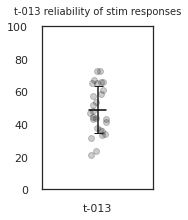

In [5]:
# %% RELIABILITY MEASUREMENTS and PLOT - PHOTOSTIM TARGETED CELLS
# measure, for each cell, the pct of trials in which the dFF > 20% post stim (normalized to pre-stim avgF for the trial and cell)
# can plot this as a bar plot for now showing the distribution of the reliability measurement

expobj.reliability = aoutils.calculate_reliability(expobj=expobj, dfstdf_threshold=0.3)
pj.bar_with_points(data=[list(expobj.reliability.values())], x_tick_labels=['t-013'], ylims=[0, 100], bar=False,
                   title='%s reliability of stim responses' % trial, expand_size_x=2)


/home/pshah/Documents/code/PackerLab_pycharm/alloptical_plotting.py:134: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


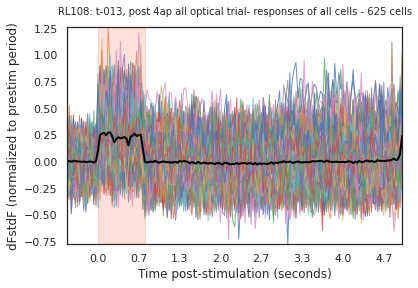

In [12]:
# %% PLOT AVG PHOTOSTIM PRE- POST- TRACE AVGed OVER ALL PHOTOSTIM. TRIALS - NON - TARGETS
x = np.asarray([i for i in expobj.dfstdF_traces_avg])
# y_label = 'pct. dFF (normalized to prestim period)'
y_label = 'dFstdF (normalized to prestim period)'

aoplot.plot_photostim_avg(dff_array=x, expobj=expobj, stim_duration=expobj.duration_frames, pre_stim=expobj.pre_stim,
                          post_stim=expobj.post_stim,
                          title=(experiment + '- responses of all cells'),
                          y_label=y_label, x_label='Time post-stimulation (seconds)')

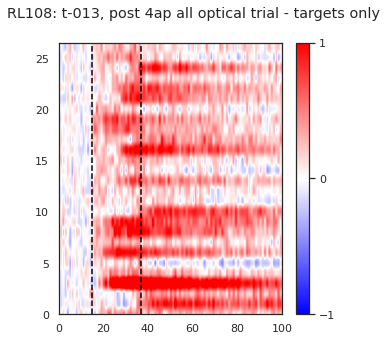

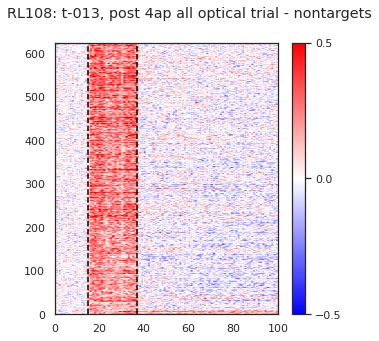

In [20]:
# %% PLOT HEATMAP OF AVG PRE- POST TRACE AVGed OVER ALL PHOTOSTIM. TRIALS - ALL CELLS (photostim targets at top) - Lloyd style :D

x = np.asarray([i for i in expobj.targets_dfstdF_avg])
aoplot.plot_traces_heatmap(x, vmin=-1, vmax=1, stim_on=expobj.pre_stim, stim_off=expobj.pre_stim + expobj.duration_frames - 1,
                           title=(experiment + ' - targets only'), cmap='bwr')

x = np.asarray([i for i in expobj.dfstdF_traces_avg])
aoplot.plot_traces_heatmap(x, vmin=-0.5, vmax=0.5, stim_on=expobj.pre_stim, stim_off=expobj.pre_stim + expobj.duration_frames - 1,
                           title=(experiment + ' - nontargets'))


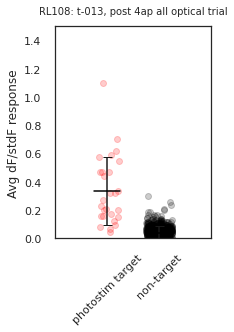

In [8]:
# %% BAR PLOT PHOTOSTIM RESPONSES SIZE - TARGETS vs. NON-TARGETS
# collect photostim timed average dff traces
all_cells_dff = []
good_std_cells = []


## using pj.bar_with_points() for a nice bar graph
group1 = list(expobj.average_responses_dfstdf[expobj.average_responses_dfstdf['group'] == 'photostim target'][
                  'Avg. dF/stdF response'])
group2 = list(
    expobj.average_responses_dfstdf[expobj.average_responses_dfstdf['group'] == 'non-target']['Avg. dF/stdF response'])
pj.bar_with_points(data=[group1, group2], x_tick_labels=['photostim target', 'non-target'], xlims=[0, 0.6],
                   ylims=[0, 1.5], bar=False,
                   colors=['red', 'black'], title=experiment, y_label='Avg dF/stdF response', expand_size_y=1.3,
                   expand_size_x=1.4)


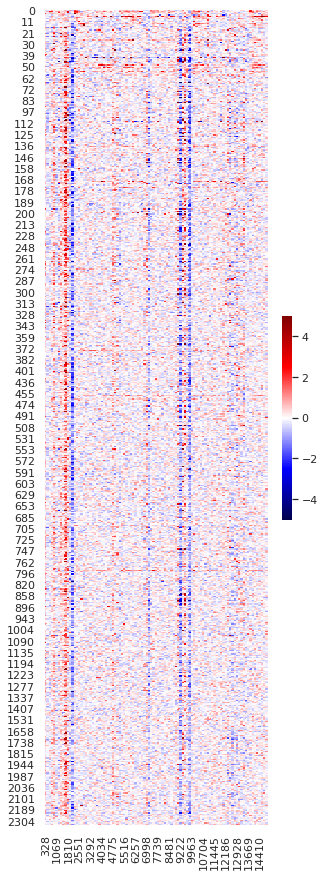

In [9]:
# %% PLOT HEATMAP OF PHOTOSTIM. RESPONSES TO PHOTOSTIM FOR ALL CELLS
# - need to find a way to sort these responses that similar cells are sorted together
# - implement a heirarchical clustering method

stim_timings = [str(i) for i in expobj.stim_start_frames]  # need each stim start frame as a str type for pandas slicing

# make heatmap of responses across all cells across all stims
df_ = expobj.dfstdf_all_cells[stim_timings]  # select appropriate stim time reponses from the pandas df
df_ = df_[df_.columns].astype(float)

plt.figure(figsize=(5, 15));
sns.heatmap(df_, cmap='seismic', vmin=-5, vmax=5, cbar_kws={"shrink": 0.25});
plt.show()


/home/pshah/Documents/code/PackerLab_pycharm/alloptical_plotting.py:332: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("bwr"))
  cmap.set_bad(color='black')


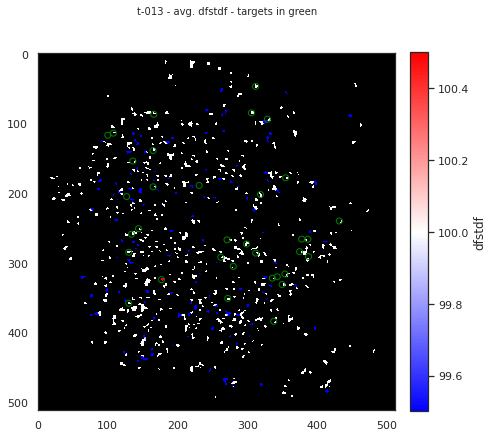

In [11]:
# %% PLOT imshow() XY locations with COLORS AS average response of ALL cells in FOV
aoplot.xyloc_responses(expobj, to_plot='dfstdf', clim=[-0.5, +0.5], plot_target_coords=True)


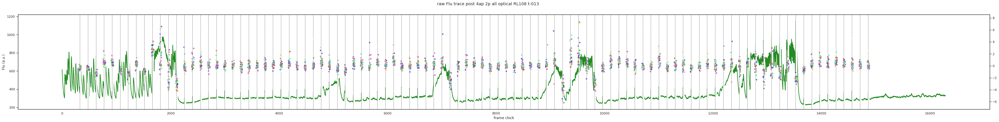

In [3]:
# %% plot the target photostim responses for individual targets for each stim over the course of the trial
#    (normalize to each target's overall mean response) and plot over the timecourse of the trial


SLMtarget_ids = list(range(len(expobj.SLMTargets_stims_dfstdF)))
target_colors = pj.make_random_color_array(SLMtarget_ids)

# --- plot with mean FOV fluorescence signal
fig, ax1 = plt.subplots(figsize=[60, 6])
fig, ax1 = aoplot.plotMeanRawFluTrace(expobj=expobj, stim_span_color='white', x_axis='frames', figsize=[20, 3], show=False,
                                      fig=fig, ax=ax1)
ax2 = ax1.twinx()
for target in expobj.responses_SLMtargets.keys():
    mean_response = np.mean(expobj.responses_SLMtargets[target])
    # print(mean_response)
    for i in range(len(expobj.stim_start_frames)):
        response = expobj.responses_SLMtargets[target][i] - mean_response
        rand = np.random.randint(-15, 25, 1)[0] #* 1/(abs(response)**1/2)
        ax2.scatter(x=expobj.stim_start_frames[i] + rand, y=response, color=target_colors[target], alpha=0.70, s=15, zorder=4)
# for i in expobj.stim_start_frames:
#     plt.axvline(i)
plt.show()


38.470768123342694
35.73513677041127
23.08679276123039
30.886890422961002
27.29468812791236
38.48376280978771
14.212670403551897
36.76955262170048
36.76955262170048
36.76955262170048
36.76955262170048
36.76955262170048
36.76955262170048
22.005681084665383
22.005681084665383
22.005681084665383
22.005681084665383
12.658988901172163
12.658988901172163


<ipython-input-12-d8c4ff7645ee>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


12.658988901172163
12.658988901172163
32.0624390837628
14.212670403551897
14.212670403551897
31.780497164141405
24.839484696748443
31.064449134018133
20.248456731316587
16.278820596099706
16.278820596099706
36.6742416417845
29.017236257093817
29.017236257093817
29.017236257093817
26.92582403567252
38.2099463490856
16.401219466856723
16.401219466856723
38.74596753211874
38.74596753211874
20.0
12.165525060596437
38.74596753211874
38.74596753211874
30.886890422961002
27.16615541441225
32.28002478313795
38.58756276314948
10.63014581273465
10.63014581273465
39.05124837953328
39.05124837953328
23.706539182259394
39.05124837953328
24.020824298928627
18.38477631085024
18.38477631085024
18.38477631085024
18.38477631085024
18.38477631085024
16.194134740701646
22.343902971504328
36.1386219991853
28.040149785619903
33.060550509633075
27.018512172212596
24.413111231467404
21.633307652783937
24.16609194718914
31.827660925679098
24.16609194718914
24.413111231467404
37.963798545456434
28.8444102037119

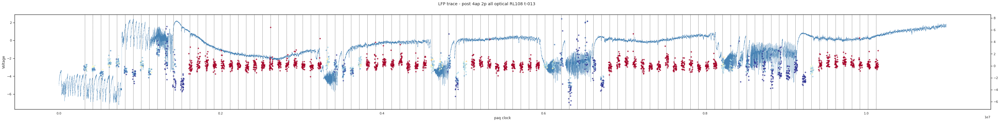

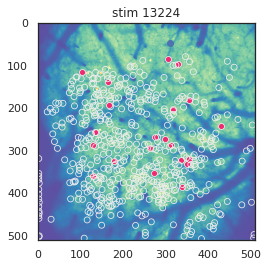

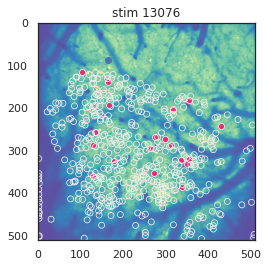

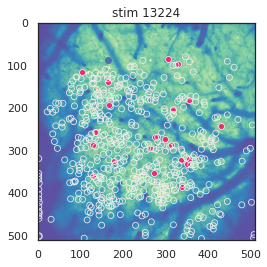

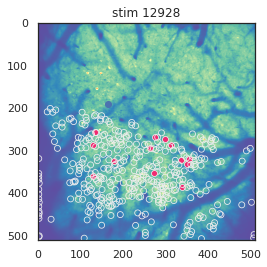

...

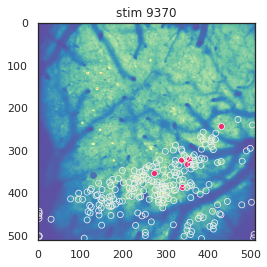

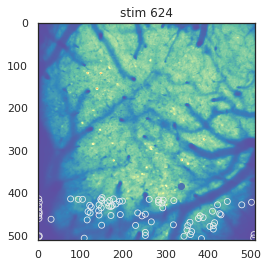

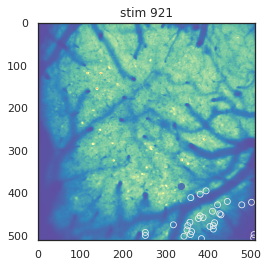

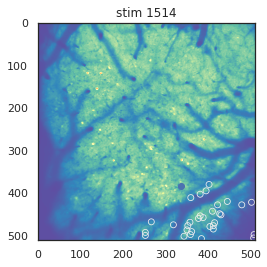

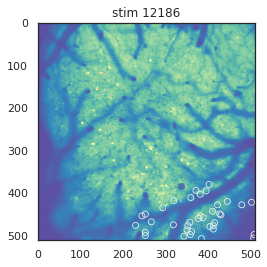

In [12]:
# %% --- plot with LFP signal
fig1, ax1 = plt.subplots(figsize=[60, 6])
fig1, ax1 = aoplot.plotLfpSignal(expobj, stim_span_color=None, x_axis='frames', show=False, fig=fig1, ax=ax1)
ax2 = ax1.twinx()
for target in expobj.responses_SLMtargets.keys():
    mean_response = np.mean(expobj.responses_SLMtargets[target])
    target_coord = expobj.target_coords_all[target]
    # print(mean_response)
    x = []
    y = []
    distance_to_sz = []
    for i in range(len(expobj.stim_times)):
        # the response magnitude of the current SLM target at the current stim time (relative to the mean of the responses of the target over this trial)
        response = expobj.responses_SLMtargets[target][i] - mean_response
        min_distance = pj.calc_distance_2points((0, 0), (expobj.frame_x,
                                                         expobj.frame_y))  # maximum distance possible between two points within the FOV, used as the starting point when the sz has not invaded FOV yet

        if expobj.stim_start_frames[i] in list(expobj.cells_sz_stim.keys()):
            # collect cells from this stim that are in sz
            s2pcells_sz = expobj.cells_sz_stim[expobj.stim_start_frames[i]]

            # classify the SLM target as in or out of sz, if out then continue with mesauring distance to seizure wavefront,
            # if in sz then assign negative value for distance to sz wavefront
            sz_border_path = "%s/boundary_csv/2020-12-18_%s_stim-%s.tif_border.csv" % (
                expobj.analysis_save_path, trial, expobj.stim_start_frames[i])

            in_sz_bool = expobj._InOutSz(cell_med=[target_coord[1], target_coord[0]],
                                         sz_border_path=sz_border_path)

            if expobj.stim_start_frames[i] in expobj.not_flip_stims:
                flip = False
            else:
                flip = True
                in_sz_bool = not in_sz_bool

            if in_sz_bool is True:
                min_distance = -1

            else:
                ## working on add feature for edgecolor of scatter plot based on calculated distance to seizure
                ## -- thinking about doing this as comparing distances between all targets and all suite2p ROIs,
                #     and the shortest distance that is found for each SLM target is that target's distance to seizure wavefront
                # calculate the min distance of slm target to s2p cells classified inside of sz boundary at the current stim
                if len(s2pcells_sz) > 0:
                    for j in range(len(s2pcells_sz)):
                        s2p_idx = expobj.cell_id.index(s2pcells_sz[j])
                        dist = pj.calc_distance_2points(target_coord, tuple(
                            [expobj.stat[s2p_idx]['med'][1], expobj.stat[s2p_idx]['med'][0]]))  # distance in pixels
                        if dist < min_distance:
                            min_distance = dist

                        # if j < 5:
                        #     fig, ax = pj.plot_cell_loc(expobj, cells=[s2pcells_sz[j]], show=False, fig=fig, ax=ax,
                        #                                background=expobj.meanFluImg_registered)
                        #     ax.scatter(x=target_coord[0], y=target_coord[1])

            if 10 < min_distance < 40:
                fig, ax = plt.subplots()
                fig, ax = alloptical_plotting.plot_cell_loc(expobj, cells=s2pcells_sz, show=False, fig=fig, ax=ax,
                                                            background=expobj.meanFluImg_registered)
                ax.scatter(x=target_coord[0], y=target_coord[1])
                plt.title('stim %s' % expobj.stim_start_frames[i])
                fig.show()
                print(min_distance)

        # min_distance.append((np.random.rand(1) * 1000)[0])  # just for testing
        distance_to_sz.append(min_distance)
        # plot the response magnitude of the current SLM target at the current stim time
        rand = np.random.randint(-10, 30, 1)[
            0]  # * 1/(abs(response)**1/2)  # used for adding random jitter to the x loc scatter point
        x.append(expobj.stim_times[i] + rand * 1e3)
        y.append(response)
    ax2.scatter(x=x, y=y, c=distance_to_sz, cmap='RdYlBu_r',
                alpha=0.70, s=15,
                zorder=4)  # use cmap correlated to distance from seizure to define colors of each target at each individual stim times
    # fig1.show()
    # ax2.scatter(x=x, y=y, c=distance_to_sz, cmap='RdYlBu_r',
    #             alpha=0.70, s=15,
    #             zorder=4)  # use cmap correlated to distance from seizure to define colors of each target at each individual stim times
    # ax2.scatter(x=expobj.stim_times[i] + rand * 1e3, y=response, edgecolor=target_colors[target], alpha=0.70, s=15, zorder=4)  # use same edgecolor for each target at all stim times
# for i in expobj.stim_start_frames:
#     plt.axvline(i)
fig1.show()